In [7]:
# Standard plotly imports
import cufflinks as cf
import pandas as pd
import pickle
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.plotly as py

from plotly.offline import iplot, init_notebook_mode

init_notebook_mode(connected=True)
cf.go_offline()
cf.set_config_file(world_readable=True, theme='pearl', offline=True)
with open('mi_results.pkl', 'rb') as results:
    df = pickle.load(results)

# Individual Brain Profiling

The first goal of this study is to determine whether if we have one subject's skull-stripped brain MRI, would it be possible for us to reliably recognize that subject's brain given an anonymized candidate?

At first we considered how we might be able to extract certain features to characterize the target subject and to compare different brains. This is certainly an approach that should and will be examined further in the future, however, with our goal in mind, a simpler solution might be already be available - As MRI scans must be realigned to some reference template before any form of group or comparative analysis can take place, a large variety of methods for realignment (or registration) already exists. 
Once we realign the candidate scans to the target scan, it is easy to estimate the degree of mutual information between the two scans. It seems quite reasonable to assume that once in the reference space, unless something extreme happened, my own brain will always be more similar (have a higher "mutual information score") with my own brain than with any other.


To keep things simple we will first consider only T1-weighted, "anatomical" scans. We will try to recognize me from a pool of 73 subjects. We used FSL to skull-strip the scans and realign each candidate scan to an old reference scan I had of myself.

Let's have a look at some of the mutual information scores we've collected:

In [2]:
from IPython.display import display, HTML
display(HTML(df.head(25).to_html()))
display(HTML('<h2>...</h2>'))

Looks good. Now, let's examine the summary statistics with a boxplot:

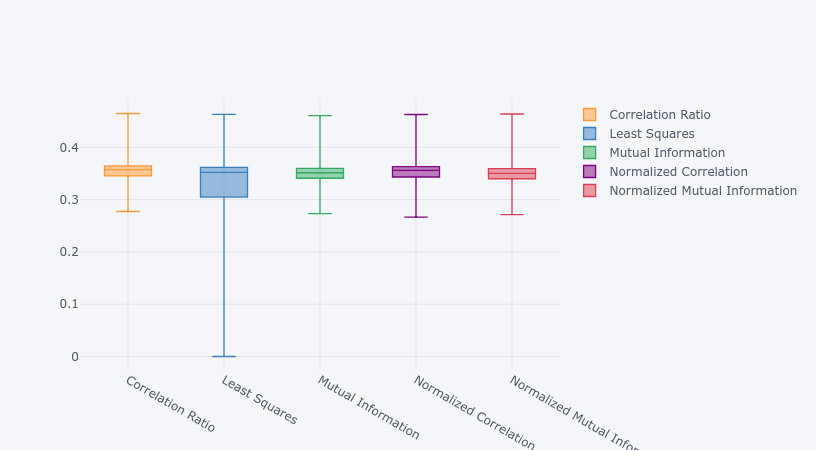

In [3]:
flat_df = df.reset_index()
flat_df.pivot(columns='Cost Function', values='Score').iplot(kind='box')

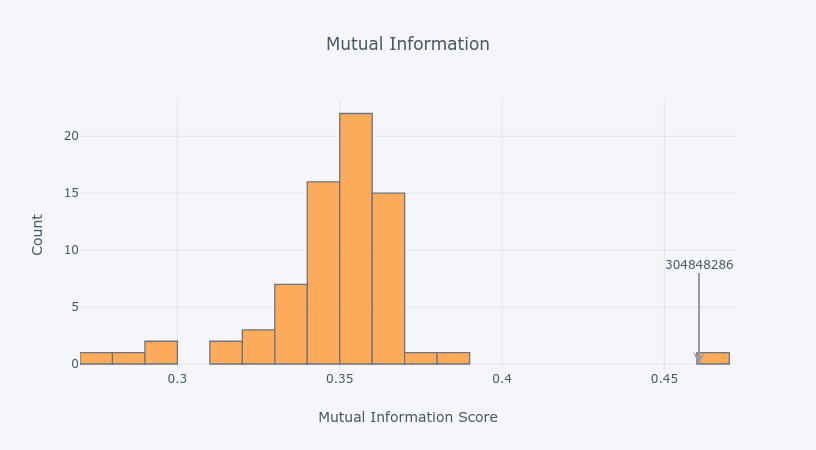

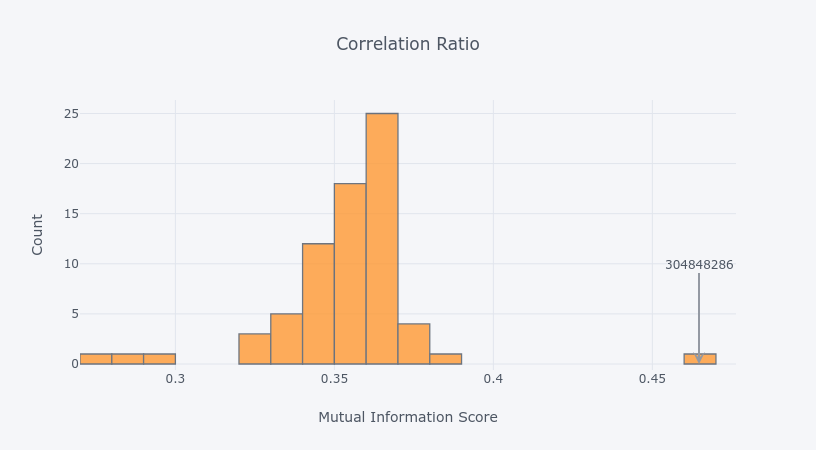

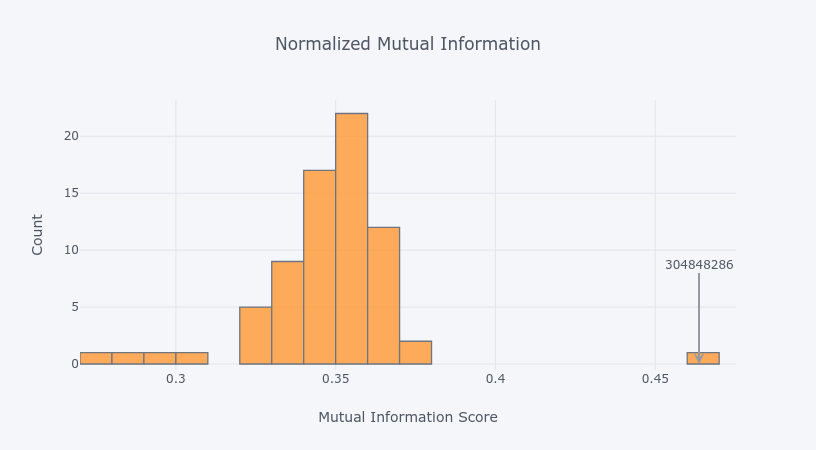

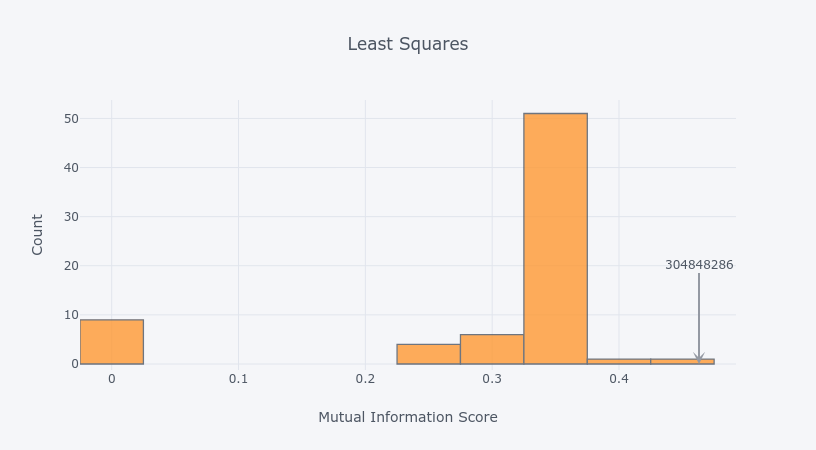

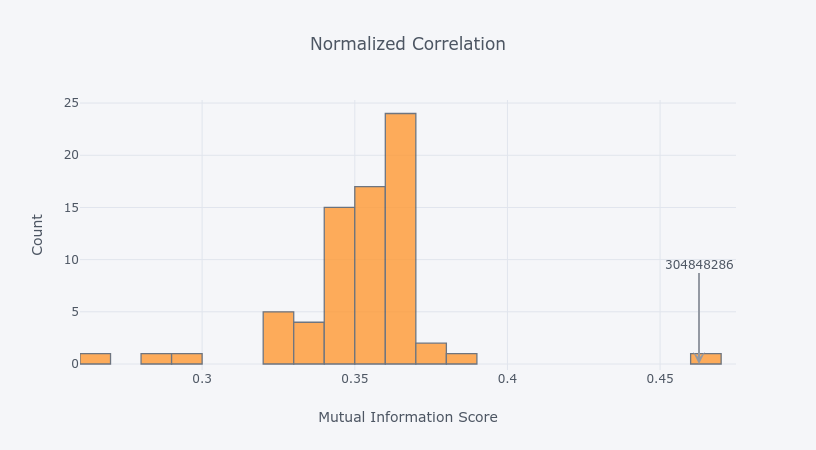

In [22]:
from scipy import stats

cost_functions = set(df.index.get_level_values(1))

for cost_function in cost_functions:
    filtered_df = flat_df.loc[flat_df['Cost Function'] == cost_function]    
    max_value_row = filtered_df.loc[filtered_df['Score'] == filtered_df['Score'].max()]
    max_value = str(max_value_row['Score'].values[0])
    subject_id = max_value_row['Subject ID'].values[0]
    x_title = 'Mutual Information Score'
    y_title = 'Count'
    annotations = [dict(x=max_value, y=0, xref='x', yref='y', text=subject_id, arrowhead=3, textangle=0, arrowsize=5)]
    filtered_df['z-score'] = stats.zscore(filtered_df['Score'])
    filtered_df['Score'].iplot(kind='hist', xTitle=x_title, yTitle=y_title, title=cost_function, annotations=annotations)
    



Or in one distribution summary plot:

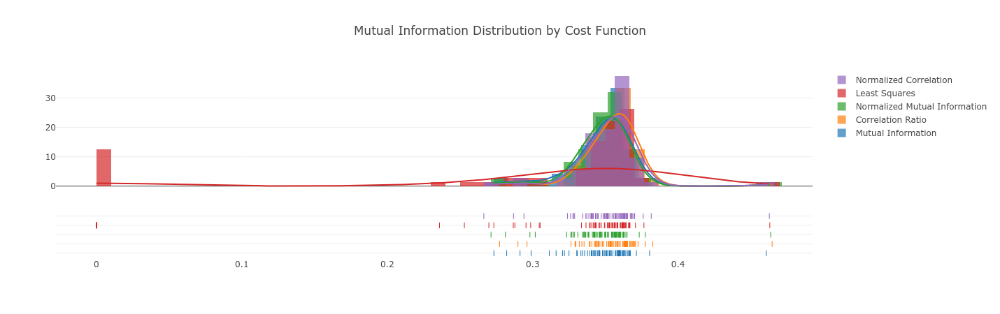

In [50]:

cost_functions = list(set(df.index.get_level_values(1)))
data = [list(flat_df.loc[flat_df['Cost Function'] == cost_function]['Score']) for cost_function in cost_functions]
figure = ff.create_distplot(data, cost_functions, bin_size=0.01)
figure['layout'].update(title='Mutual Information Distribution by Cost Function')
iplot(figure)


It seems that the target subject had the highest mutual information score for all cost functions, although the difference under least squares was not as significant as for the others.

If we estimate the z-score of our target subject using the sample mean and standard deviation, we can see there are more than two standard deviations between the target subject and the closest after it. 

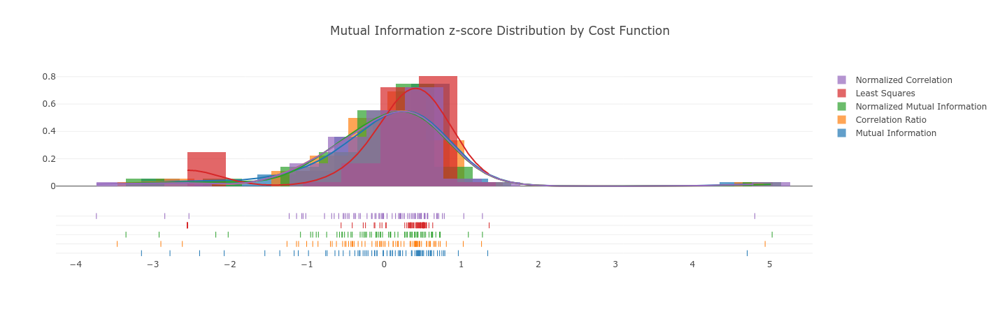

Maximal z-score as percentile:
	Mutual Information: 0.0000012475
	Correlation Ratio: 0.0000003885
	Normalized Mutual Information: 0.0000002429
	Least Squares: 0.0866650668
	Normalized Correlation: 0.0000007669

The most significant mutual information score was obtained with Normalized Mutual Information (=2.42913293251536e-07)


In [55]:
from scipy import stats
data = [list(stats.zscore(flat_df.loc[flat_df['Cost Function'] == cost_function]['Score'])) for cost_function in cost_functions]
figure = ff.create_distplot(data, cost_functions, bin_size=0.5)
figure['layout'].update(title='Mutual Information z-score Distribution by Cost Function')
iplot(figure)
percentiles = stats.norm.sf([max(d) for d in data])
print('Maximal z-score as percentile:')
for i, p in enumerate(percentiles):
    print(f'\t{cost_functions[i]}: {p:.10f}')

best_method = cost_functions[list(percentiles).index(min(percentiles))]    
print(f'\nThe most significant mutual information score was obtained with the {best_method} cost function (={min(percentiles)})')